<a href="https://colab.research.google.com/github/atulshah16/DeepLearningCMP258/blob/master/Shah_Atul_014530243_GradedAssignment3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Graded Assignment #3 Planet Amazon

###Name: Atul Shah
###Studednt ID: 014530243


### Data Set:
https://www.kaggle.com/c/planet-understanding-the-amazon-from-space

##Setting up Kaggle

### Upload Kaggle api token

In [0]:
from google.colab import files
files.upload() #upload kaggle.json

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"atulshahkag","key":"5b4353788e70e99124c317048fdc8049"}'}

In [0]:
!pip install -q kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!ls ~/.kaggle
!chmod 600 /root/.kaggle/kaggle.json

kaggle.json


In [0]:
!kaggle kernels list --user atulshahkag --sort-by dateRun


No kernels found


In [0]:
# importing libraries
%reload_ext autoreload
%autoreload 2
%matplotlib inline
import pandas as pd

import cv2
import numpy
import glob
import pylab as plt
import os
import cv2
from tqdm import tqdm

# importing libraries
from matplotlib import pyplot
from keras import datasets
from keras import Sequential
from keras.layers import Dense,Flatten
from keras.utils import to_categorical
import tensorflow as tf
import numpy as np
import os
import matplotlib.pyplot as plt

from keras.callbacks import TensorBoard

from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

from datetime import datetime
from packaging import version


#from kerastuner.tuners import RandomSearch
from keras.layers import Input, Dense
from keras.models import Model
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense, Activation
from keras.optimizers import SGD
from tensorboard.plugins.hparams import api as hp
from keras.utils import print_summary, to_categorical

print("TensorFlow version: ", tf.__version__)
assert version.parse(tf.__version__).release[0] >= 2, \
    "This notebook requires TensorFlow 2.0 or above."
from datetime import datetime
#%load_ext tensorboard
# %reload_ext tensorboard
#%tensorboard --logdir {logs_base_dir}



Using TensorFlow backend.


TensorFlow version:  2.2.0-rc4


In [0]:
# installing kaggle

!pip install kaggle --upgrade

Requirement already up-to-date: kaggle in /usr/local/lib/python3.6/dist-packages (1.5.6)


In [0]:
from google.colab import drive
drive.mount('/content/drive/')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive/


In [0]:
# make a local directory for kaggle importing the neccesary dataset
!mkdir -p ~/.kaggle

In [0]:
# giving 600 permissions
!chmod 600 ~/.kaggle/kaggle.json

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
!mv  /content/kaggle.json ~/.kaggle/

In [0]:
# !chmod 600 /content/drive/My\ Drive/kaggle.json
#!ls /content/drive/My\ Drive

##NOTE:------- UNZIP and extract files-------
!unzip /content/sample_submission_v2.csv.zip
!unzip /content/train_v2.csv.zip

Archive:  /content/sample_submission_v2.csv.zip
replace sample_submission_v2.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: sample_submission_v2.csv  
Archive:  /content/train_v2.csv.zip
replace train_v2.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: train_v2.csv            


In [0]:
!pip uninstall -y kaggle
!pip install --upgrade pip
!pip install kaggle==1.5.6
!kaggle -v

Uninstalling kaggle-1.5.6:
  Successfully uninstalled kaggle-1.5.6
     |████████████████████████████████| 1.5MB 4.6MB/s 
  Found existing installation: pip 19.3.1
    Uninstalling pip-19.3.1:
      Successfully uninstalled pip-19.3.1
     |████████████████████████████████| 58 kB 2.7 MB/s 
  Created wheel for kaggle: filename=kaggle-1.5.6-py3-none-any.whl size=72859 sha256=fadd62be3c193eca7fabd5d7e81fb71f72f035af8d048b7d8d2eee69463967ff
  Stored in directory: /root/.cache/pip/wheels/01/3e/ff/77407ebac3ef71a79b9166a8382aecf88415a0bcbe3c095a01
Successfully built kaggle
Kaggle API 1.5.6


In [0]:
# Download the amazon planet dataset 

!kaggle competitions download -c planet-understanding-the-amazon-from-space

  0% 0.00/2.94M [00:00<?, ?B/s]
100% 2.94M/2.94M [00:00<00:00, 244MB/s]


In [0]:
!mv /content/planet-understanding-the-amazon-from-space.zip /content/drive/My\ Drive/

In [0]:
!unzip /content/drive/My\ Drive/planet-understanding-the-amazon-from-space.zip

Archive:  /content/drive/My Drive/planet-understanding-the-amazon-from-space.zip
  inflating: Kaggle-planet-test-tif.torrent  
  inflating: Kaggle-planet-train-tif.torrent  
  inflating: sample_submission_v2.csv/sample_submission_v2.csv  
  inflating: test_v2_file_mapping.csv/test_v2_file_mapping.csv  
  inflating: train_v2.csv/train_v2.csv  


In [0]:
# use p7zip to unzip

!p7zip -d /content/drive/My\ Drive/train-jpg.tar.7z


7-Zip (a) [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.30GHz (306F0),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan /content/drive/My Drive/                                  1 file, 629296207 bytes (601 MiB)

Extracting archive: /content/drive/My Drive/train-jpg.tar.7z
--
Path = /content/drive/My Drive/train-jpg.tar.7z
Type = 7z
Physical Size = 629296207
Headers Size = 98
Method = LZMA2:24
Solid = -
Blocks = 1

  0%    
Would you like to replace the existing file:
  Path:     ./train-jpg.tar
  Size:     665753600 bytes (635 MiB)
  Modified: 2017-04-19 21:59:23
with the file from archive:
  Path:     train-jpg.tar
  Size:     665753600 bytes (635 MiB)
  Modified: 2017-04-19 21:59:23
? (Y)es / (N)o / (A)lways / (S)kip all / A(u)to rename all / (Q)uit? A

  0% - train-jpg.tar

In [0]:
!p7zip -d /content/train-jpg.tar.7z


7-Zip (a) [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (406F0),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan /content/                   1 file, 13631488 bytes (13 MiB)

Extracting archive: /content/train-jpg.tar.7z
ERROR: /content/train-jpg.tar.7z
/content/train-jpg.tar.7z
Open ERROR: Can not open the file as [7z] archive


ERRORS:
Unexpected end of archive
  0%    
Can't open as archive: 1
Files: 0
Size:       0
Compressed: 0


In [0]:
# Untar the files
!tar -xvf /content/test-jpg.tar
!tar -xvf /content/train-jpg.tar

tar: /content/test-jpg.tar: Cannot open: No such file or directory
tar: Error is not recoverable: exiting now
tar: /content/train-jpg.tar: Cannot open: No such file or directory
tar: Error is not recoverable: exiting now


##Data Extraction

In [0]:

def load_data():

  x_features_train = []
  y_target_train = []

  data_train = pd.read_csv('/content/train_v2.csv')

  flat_data = lambda l: [item for sublist in l for item in sublist]
  labels = list(set(flat_data([l.split(' ') for l in data_train['tags'].values])))

  l_mapping = {l: i for i, l in enumerate(labels)}
  inv_l_mapping = {i: l for l, i in l_mapping.items()}

  for f, tags in tqdm(data_train.values, miniters=1000):
      img = cv2.imread('/content/train-jpg/{}.jpg'.format(f))
      targets = np.zeros(17)
      for t in tags.split(' '):
          targets[l_mapping[t]] = 1 
      x_features_train.append(cv2.resize(img, (32, 32)))
      y_target_train.append(targets)
    
  y_target_train = np.array(y_target_train, np.uint8)
  x_features_train = np.array(x_features_train, np.float16) / 255.

  print(x_features_train.shape)
  print(y_target_train.shape)
  return x_features_train , y_target_train




##Setting up features and Target for training data

In [0]:
x_features_train , y_target_train = load_data()



  0%|          | 0/40479 [00:00<?, ?it/s]

  2%|▏         | 1000/40479 [00:01<00:55, 713.42it/s]

  5%|▍         | 2000/40479 [00:02<00:53, 716.54it/s]

  7%|▋         | 3000/40479 [00:04<00:52, 716.05it/s]

 10%|▉         | 4000/40479 [00:05<00:51, 713.73it/s]

 12%|█▏        | 5000/40479 [00:06<00:49, 716.05it/s]

 15%|█▍        | 6000/40479 [00:08<00:48, 711.71it/s]

 17%|█▋        | 7000/40479 [00:09<00:46, 713.26it/s]

 20%|█▉        | 8000/40479 [00:11<00:45, 707.23it/s]

 22%|██▏       | 9000/40479 [00:12<00:44, 709.61it/s]

 25%|██▍       | 10000/40479 [00:14<00:42, 710.35it/s]

 27%|██▋       | 11000/40479 [00:15<00:41, 708.93it/s]

 30%|██▉       | 12000/40479 [00:16<00:40, 710.29it/s]

 32%|███▏      | 13000/40479 [00:18<00:38, 711.75it/s]

 35%|███▍      | 14000/40479 [00:19<00:37, 711.22it/s]

 37%|███▋      | 15000/40479 [00:21<00:35, 708.83it/s]

 40%|███▉      | 16000/40479 [00:22<00:34, 709.37it/s]

 42%|████▏     | 17000/40479 [00:23<00:32, 712.69it/s]

 44%|████▍  

(40479, 32, 32, 3)
(40479, 17)


##Splitting Training and Testing data

In [0]:
fold = 35000
x_features_train, x_features_validation, y_target_train, y_target_validation = x_features_train[:fold], x_features_train[fold:], y_target_train[:fold], y_target_train[fold:]

##Visualize the data and its shape

In [0]:
print('Train: X=%s, y=%s' % (x_features_train.shape, y_target_train.shape))
print('Test: X=%s, y=%s' % (x_features_validation.shape, y_target_validation.shape))

Train: X=(35000, 32, 32, 3), y=(35000, 17)
Test: X=(5479, 32, 32, 3), y=(5479, 17)


##Setting up Data Types

In [0]:
x_features_train = x_features_train.astype('float32')
x_features_validation = x_features_validation.astype('float32')

## Normalization of Data

In [0]:
x_features_train = x_features_train / 255.0
x_features_validation = x_features_validation / 255.0

## Plotting features

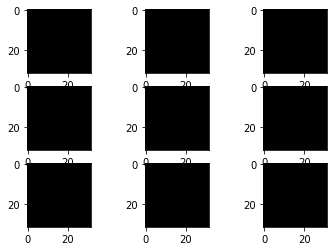

In [0]:
for i in range(9):
	# define subplot
	pyplot.subplot(330 + 1 + i)
	# plot raw pixel data
	pyplot.imshow(cv2.cvtColor(x_features_train[i], cv2.COLOR_BGR2RGBA))
# show the figure
pyplot.show()

##Visualization of Images

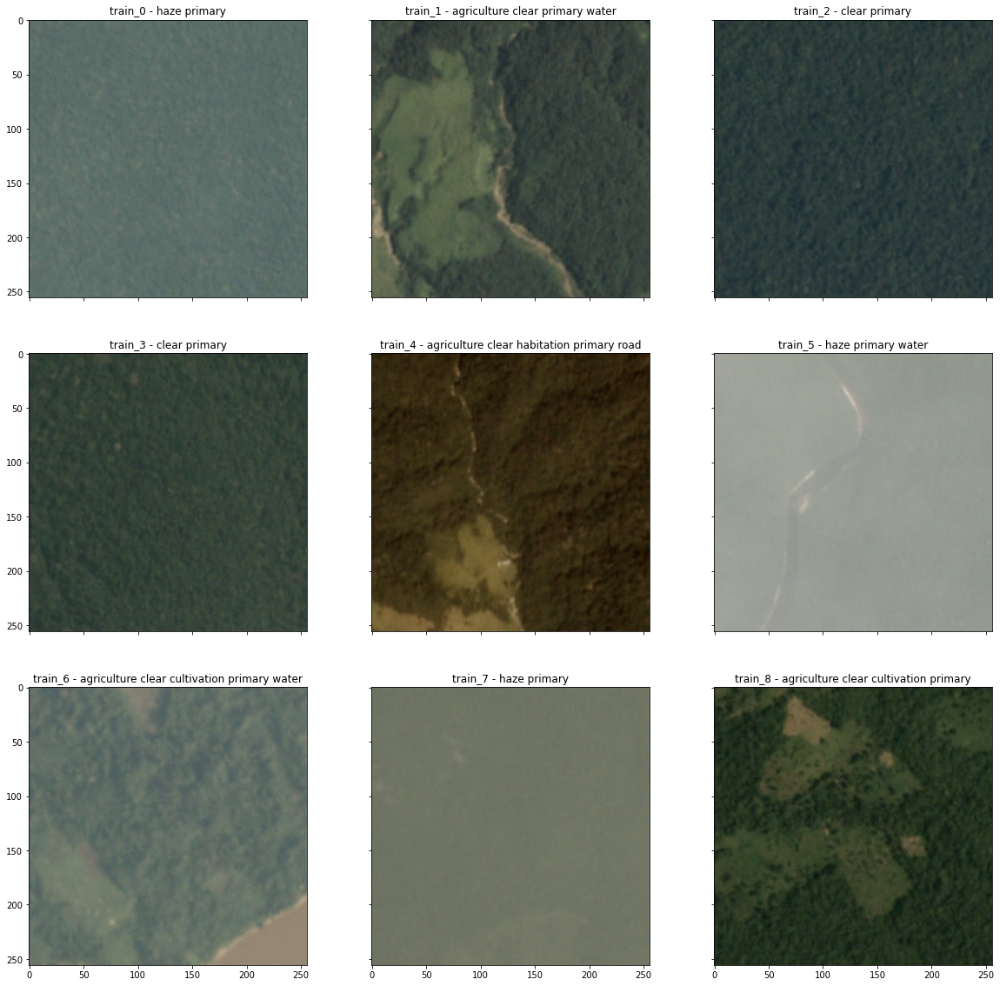

In [0]:
new_style = {'grid': False}
plt.rc('axes', **new_style)
_, ax = plt.subplots(3, 3, sharex='col', sharey='row', figsize=(20, 20))
i = 0
for f, l in data_train[:9].values:
    img = cv2.imread('/content/train-jpg/{}.jpg'.format(f))
    ax[i // 3, i % 3].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax[i // 3, i % 3].set_title('{} - {}'.format(f, l))
    #ax[i // 4, i % 4].show()
    i += 1
    
plt.show()

## TensorBoard

In [0]:
logdir = "logs/planet/" + datetime.now().strftime("%Y%m%d-%H%M%S")



### Log directory file Writer



In [0]:
file_writer = tf.summary.create_file_writer(logdir)

### Log the reshaped image


In [0]:
with file_writer.as_default():
  tf.summary.image("Training data", np.reshape(x_features_train[0:50],(-1,32,32,3)), step=0)

In [0]:
%tensorboard --logdir logs/planet/

Reusing TensorBoard on port 6007 (pid 2364), started 0:39:11 ago. (Use '!kill 2364' to kill it.)

<IPython.core.display.Javascript object>

### SIMPLE FEED FORWARD NETWORK

In [0]:
def keras_sequential_model():
  
  model=tf.keras.Sequential()
  model.add(tf.keras.layers.Flatten(input_shape=[32, 32, 3]))
  model.add(tf.keras.layers.Dense(120,activation='relu',kernel_initializer='he_normal'))
  model.add(tf.keras.layers.Dense(17,activation='softmax'))
  return model

### Model Summary

In [0]:
model=keras_sequential_model()
optimizer = keras.optimizers.Nadam(lr=5e-5)
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_1 (Flatten)          (None, 3072)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 120)               368760    
_________________________________________________________________
dense_3 (Dense)              (None, 17)                2057      
Total params: 370,817
Trainable params: 370,817
Non-trainable params: 0
_________________________________________________________________


### Network Architecture

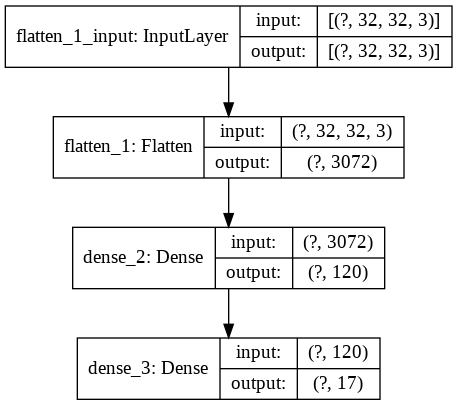

In [0]:
keras.utils.plot_model(model, "amazon_planet.png", show_shapes=True)

### Model Compilation

In [0]:
model.compile(loss="binary_crossentropy",
              optimizer=optimizer,
              metrics=["accuracy",'mse'])

### Tensorboard Logs

### Setting up checkpoints

In [0]:
callback_early_stopping = tf.keras.callbacks.EarlyStopping(patience=20)
callback_model_checkpoint = tf.keras.callbacks.ModelCheckpoint("amazon_planet_model.h5", save_best_only=True)
logdir="logs/planet/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = keras.callbacks.TensorBoard(log_dir=logdir)

In [0]:
X_valid = x_features_train[:5000]
Y_valid = y_target_train[:5000]

### Fitting the model

In [0]:
model.fit(x_features_train, y_target_train, epochs=2,
          validation_data=(X_valid, Y_valid),
          callbacks=[callback_early_stopping,callback_model_checkpoint,tensorboard_callback])

### Another model with different params

In [0]:
keras.backend.clear_session()
tf.random.set_seed(42)
np.random.seed(42)

model = keras.models.Sequential()
model.add(keras.layers.Flatten(input_shape=[32, 32, 3]))
model.add(keras.layers.BatchNormalization())

model.add(keras.layers.Dense(250, kernel_initializer="he_normal"))
model.add(keras.layers.BatchNormalization())
model.add(keras.layers.Activation("selu"))
model.add(keras.layers.Dense(17, activation="softmax"))

optimizer = keras.optimizers.Nadam(lr=1e-5)
model.compile(loss="binary_crossentropy",
              optimizer=optimizer,
              metrics=["accuracy"])


early_stopping_cb = keras.callbacks.EarlyStopping(patience=10)
model_checkpoint = tf.keras.callbacks.ModelCheckpoint("amazon_planet_bn_model.h5", save_best_only=True)
logdir="logs/planet/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = keras.callbacks.TensorBoard(log_dir=logdir)

keras.utils.plot_model(model, "amazon_planet_bn_model.png", show_shapes=True)

model.fit(x_features_train, y_target_train, epochs=10,
          validation_data=(X_valid, Y_valid),
          callbacks=[early_stopping_cb,model_checkpoint,tensorboard_callback])

model = keras.models.load_model("amazon_planet_bn_model.h5")
model.evaluate(X_valid, Y_valid)

Epoch 1/10
1094/1094 [==============================] - 21s 19ms/step - loss: 0.4792 - accuracy: 0.3615 - val_loss: 0.4469 - val_accuracy: 0.4048
Epoch 2/10
1094/1094 [==============================] - 20s 19ms/step - loss: 0.4336 - accuracy: 0.3806 - val_loss: 0.4125 - val_accuracy: 0.3866
Epoch 3/10
1094/1094 [==============================] - 20s 19ms/step - loss: 0.4047 - accuracy: 0.3596 - val_loss: 0.3854 - val_accuracy: 0.3600
Epoch 4/10
1094/1094 [==============================] - 21s 19ms/step - loss: 0.3822 - accuracy: 0.3274 - val_loss: 0.3672 - val_accuracy: 0.3554
Epoch 5/10
1094/1094 [==============================] - 21s 19ms/step - loss: 0.3664 - accuracy: 0.2846 - val_loss: 0.3531 - val_accuracy: 0.2716
Epoch 6/10
1094/1094 [==============================] - 20s 19ms/step - loss: 0.3543 - accuracy: 0.2407 - val_loss: 0.3429 - val_accuracy: 0.2646
Epoch 7/10
1094/1094 [==============================] - 21s 19ms/step - loss: 0.3454 - accuracy: 0.2025 - val_loss: 0.3362 -

[0.32496342062950134, 0.20980000495910645]

### CNN Model

In [0]:
def convnet_model():

  model = keras.models.Sequential()
  model.add(keras.layers.Conv2D(32, kernel_size=(3, 3),
                 activation='relu',
                 input_shape=(32, 32, 3)))

  model.add(keras.layers.Conv2D(64, (3, 3), activation='relu'))
  model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
  model.add(keras.layers.Dropout(0.25))
  model.add(keras.layers.Flatten())
  model.add(keras.layers.Dense(128, activation='relu'))
  model.add(keras.layers.Dropout(0.5))
  model.add(keras.layers.Dense(17, activation='sigmoid'))
  return model


In [0]:
convnet =convnet_model()

In [0]:
convnet.compile(loss='binary_crossentropy', 
              optimizer='adam',
              metrics=['accuracy'])

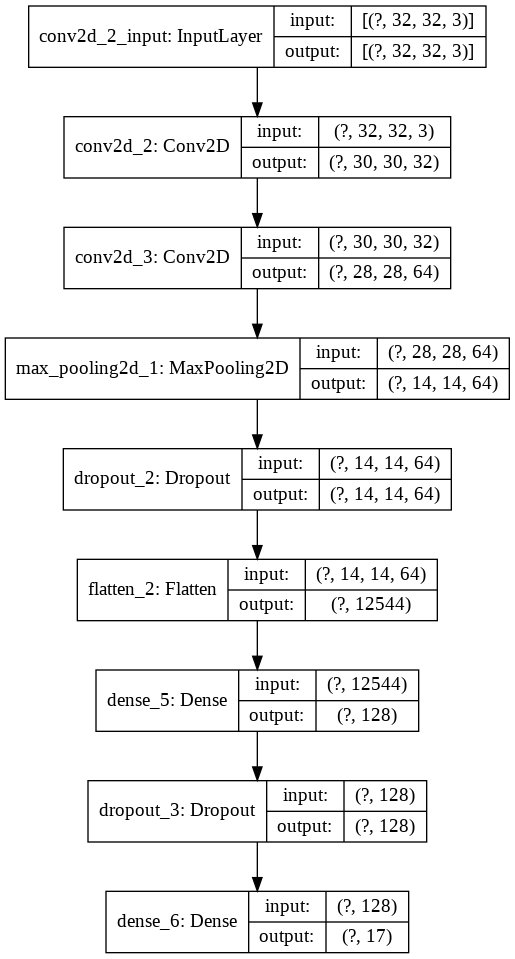

In [0]:
keras.utils.plot_model(convnet, "amazon_planet_cnn_model.png", show_shapes=True)

In [0]:

early_stopping_cb = keras.callbacks.EarlyStopping(patience=10)
model_checkpoint = tf.keras.callbacks.ModelCheckpoint("amazon_planet_cnn_model.h5", save_best_only=True)
logdir="logs/planet/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = keras.callbacks.TensorBoard(log_dir=logdir)

cnnmodel.fit(x_features_train, y_target_train,
          batch_size=128,
          epochs=4,
          verbose=1,
          validation_data=(X_valid, Y_valid),
          callbacks=[early_stopping_cb,model_checkpoint,tensorboard_callback])

Epoch 1/4
274/274 [==============================] - 113s 413ms/step - loss: 0.2792 - accuracy: 0.0041 - val_loss: 0.2338 - val_accuracy: 0.0000e+00
Epoch 2/4
274/274 [==============================] - 114s 415ms/step - loss: 0.2340 - accuracy: 0.0151 - val_loss: 0.2248 - val_accuracy: 0.0212
Epoch 3/4
274/274 [==============================] - 113s 412ms/step - loss: 0.2275 - accuracy: 0.0248 - val_loss: 0.2220 - val_accuracy: 0.0178
Epoch 4/4
274/274 [==============================] - 113s 412ms/step - loss: 0.2262 - accuracy: 0.0244 - val_loss: 0.2202 - val_accuracy: 0.0358


In [0]:
%tensorboard --logdir logs/planet/

<IPython.core.display.Javascript object>

In [0]:
!tensorboard dev upload --logdir ./logs/planet\
  --name "PLANET AMAZON Atul Shah REPORT" \
  --description ""

### Final Tensorboard Report Link

View your TensorBoard live at:https://tensorboard.dev/experiment/UeJoLfqwR2OHPWvbp5wWNQ/